In [1]:
from plotly.offline import init_notebook_mode, iplot_mpl, download_plotlyjs, plot, iplot

%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from statsmodels.graphics.factorplots import interaction_plot

import plotly_express as px
import plotly.figure_factory as ff
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
init_notebook_mode(connected=True)
from pandas_profiling import ProfileReport
import statsmodels.formula.api as sm
import missingno as msno
from sklearn.preprocessing import LabelEncoder
from statsmodels.compat import lzip
import statsmodels.api as sm
import pandas as pd

from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
import pandas as pd

from sklearn.model_selection import GridSearchCV, cross_val_score
from pandas import DataFrame
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_predict

from sklearn.metrics import accuracy_score

import catboost
from catboost import CatBoostRegressor, Pool, cv
import shap


plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'svg'

## Práctica 2: Limpieza y validación de los datos

#### M2.851 - Tipología y ciclo de vida de los datos

*Xavier Martínez Bartra*<br>
*Martín Martínez Baltar*

### Índice

- 1. Descripción del dataset. ¿Por qué es importante y qué pregunta/problema pretende responder?

- 2. Integración y selección de los datos de interés a analizar.

- 3. Limpieza de los datos.
    - 3.1. ¿Los datos contienen ceros o elementos vacíos? ¿Cómo gestionarías cada uno de estos casos?
    - 3.2. Identificación y tratamiento de valores extremos.
    
- 4. Análisis de los datos.
    - 4.1. Selección de los grupos de datos que se quieren analizar/comparar (planificación de los análisis a aplicar).
    - 4.2. Comprobación de la normalidad y homogeneidad de la varianza.
    - 4.3. Aplicación de pruebas estadísticas para comparar los grupos de datos. En función de los datos y el objetivo del estudio, aplicar pruebas de contraste de hipótesis, correlaciones, regresiones, etc. Aplicar al menos tres métodos de análisis diferentes.
    

- 5. Representación de los resultados a partir de tablas y gráficas.

- 6. Resolución del problema. A partir de los resultados obtenidos, ¿cuáles son las conclusiones? ¿Los resultados permiten responder al problema?


## 1. Descripción del dataset e importancia de los datos.

**DESCRIPCIÓN DEL DATASET**

Los datos seleccionados contienen información del nivel de ingresos y otras dimensiones cualitativas de una muestra de 92857 observaciones que pretenden representar la población adulta de Corea del Sud. La muestra contiene datos estratificados de la población coreana recopilados desde el año 2005 al año 2018; y permiten derivar desigualdades en niveles de ingresos en ámbitos como género, nivel educativo, origen familiar,….

https://www.kaggle.com/hongsean/korea-income-and-welfare?select=Korea+Income+and+Welfare.csv

La República de Corea es uno de los países con más crecimiento económico durante la última mitad de siglo. Constituye un ejercicio interesante, pues, indagar como se distribuyen los ingresos obtenidos entre la población desde diferentes enfoques qualitativos.

Los datos contienen 14 columnas y 92857 observaciones.

Las variables del dataset son las siguientes:

   - id (identificador de la persona encuestada)
   - year : año del estudio
   - wave : from wave 1st in 2005 to wave 14th in 2018
   - region: 1) Seoul 2) Kyeong-gi 3) Kyoung-nam 4) Kyoung-buk 5) Chung-nam 6) Gang-won &. Chung-buk 7) Jeolla & Jeju
   - income: yearly income in M KRW(Million Korean Won. 1100 KRW = 1 USD)
   - family_member: no. of family members
   - gender: 1) male 2) female
   - year_born
   - education_level: 1) no education(under 7 yrs-old) 2) no education(7 & over 7 yrs-old) 3) elementary 4) middle school 5) high school 6) college   7) university degree 8) MA 9) doctoral degree
   
   - marriage: marital status. 1) not applicable (under 18) 2) married 3) separated by death 4) separated 5) not married yet 6) others
   - religion: 1) have religion 2) do not have
   - occupation: this will be provided in separated code book
   - company_size
   - reason none worker: 1) no capable 2) in military service 3) studying in school 4) prepare for school 5) preprare to apply job 6) house worker 7)  caring kids at home 8) nursing 9) giving-up economic activities 10) no intention to work 11) others

**IMPORTANCIA DE LOS DATOS**

Tenemos información qualitativa diversa de como se distribuyen los ingresos entre la población sudcoreana. A partir de la variable **income** podemos analizar como ha sido la distribución de los ingresos desde distintas ópticas. (área geográfica, estudios, religión, género,..)

Si bien hay algunos valores faltantes en algunos campos como ocupación, o tamaño de la empresa del trabajador, la mayoría de campos tienen muy pocos campos vacíos.

Este dataset constituye un juego muy inexplorado y nos ofrece posibilidades de indagar sobre una temática de la que no tenemos conocimientos previos. 

Los datos nos permitirán indagar sobre cómo se distribuyen los ingresos entre la población. ¿Cuales son los grupos que tienen mayores ingresos? ¿cuáles son los que menos ¿ Hay diferencias estadísticamente significativas? ¿podemos construir un modelo de regresión explicativo con los datos?
¿cuáles son las diferencias mas notorias entre grupos ¿ y las similitudes?

Nuestro objetivo, pues, es indagar sobre las posibles desigualdades sociales que existen en los ingresos de Corea, así como generar concimiento estadístico analizando las distintas catogrias de interés.

## 2. Integración y selección de los datos de interés a analizar

Cargamos los datos en un DataFrame de pandas

In [2]:
# df= pd.read_csv("C:/Users/xavie/OneDrive/Desktop/Korea Income and Welfare.csv")
df = pd.read_csv("./data/Korea Income and Welfare.csv")

Examinamos la estructura de los datos.

In [3]:
df.head()

,id,year,wave,region,income,family_member,gender,year_born,education_level,marriage,religion,occupation,company_size,reason_none_worker
0,10101,2005,1,1,614.0,1,2,1936,2,2,2,,,8
1,10101,2011,7,1,896.0,1,2,1936,2,2,2,,,10
2,10101,2012,8,1,1310.0,1,2,1936,2,2,2,,,10
3,10101,2013,9,1,2208.0,1,2,1936,2,2,2,,,1
4,10101,2014,10,1,864.0,1,2,1936,2,2,2,,,10


Como el objetivo es el análisis de la distribución de los ingresos en la población sudcoreana solo vamos a utilizar los datos del año 2018 (análisis de datos transversales); el último año del cúal disponemos datos.

In [4]:
df=df[df['year']==2018]
df.reset_index(inplace=True)

Tenemos todos los datos cargados en el dataset. Podemos examinar el detalle del mismo con el módulo de python ProfileReport que nos reporta el detalla del dataset. Podemos observar que aunque la mayoría de variables tienen los datos completos, tendremos que tratar algunas. También tendremos que codificar adecuadamente las variables de interés. Observamos 

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 3. Limpieza de los datos.

Pasamos a realizar el proceso de limpieza de los datos para preparar el dataset adecuadamente para el posterior análisis.

### 3.1 Elementos vacíos.

- Las variables family member, gender, yearn born y education level, tiene todos los datos completos y no tenemos que tratarlas.

- Hemos visto que la variable income tiene algunos valores negativos, por lo que procedemos a eliminarlos.

In [6]:
df=df.drop(df[df.income <0].index)

La variable marriage tiene algunos valores fuera de rango (0 y 9).Procedemos a codificarlos como 6 (others).

In [7]:
df['marriage'] = df['marriage'].replace({0: 6}).astype(int)
df['marriage'] = df['marriage'].replace({9: 6}).astype(int)

La variable ocupación tiene muchas categorias. Convertimos los valores con campo vacío a 0.

Las variables company size también tienen muchas observaciones vacias que codificamos 0.

Los valores en occupation por encima de 1012, son valores erróneos que se deben eliminar o sustituir.

Los valores de reason_non_worker en 100, están fuera de rango y se deben eliminar o sustituir. company_size se deben tratar en el siguiente apartado (valores atípicos) ya que no tenemos información sobre el rango.

In [8]:
df['occupation'] = df['occupation'].replace({" ": 0}).astype(int)
df['company_size'] = df['company_size'].replace({" ": 0}).astype(int)

In [9]:
# 9999 Parece ser un valor centinela: Lo pasamos a 0 (nuestro valor centinela)
df[df['occupation'] > 1012] = 0

Creamos la variable age a partir de la variable year_born

In [10]:
df['age']=df['year']-df['year_born']

Pasamos a codificar las variables. 


In [11]:
#region (codificamos correctamente todos los datos)
df.loc[df['region'] == 1, 'region'] = 'Seoul'
df.loc[df['region'] == 2, 'region'] = 'Kyeong-gi'
df.loc[df['region'] == 3, 'region'] = 'Kyoung-nam'
df.loc[df['region'] == 4, 'region'] = 'Kyong-buk'
df.loc[df['region'] == 5, 'region'] = 'Chong-nam'
df.loc[df['region'] == 6, 'region'] = 'Gang-won & Chung-buk'
df.loc[df['region'] == 7, 'region'] = 'Jeju'

#reason none worker
df.loc[df['reason_none_worker'] == '1', 'reason_none_worker'] = 'not_capable'
df.loc[df['reason_none_worker'] == '2', 'reason_none_worker'] = 'in_military_service'
df.loc[df['reason_none_worker'] == '3', 'reason_none_worker'] = 'studying_in_school'
df.loc[df['reason_none_worker'] == '4', 'reason_none_worker'] = 'prepare_for_school'
df.loc[df['reason_none_worker'] == '5', 'reason_none_worker'] = 'prepare_to_apply_job'
df.loc[df['reason_none_worker'] == '6', 'reason_none_worker'] = 'house_worker'
df.loc[df['reason_none_worker'] == '7', 'reason_none_worker'] = 'caring_for_kids_at_home'
df.loc[df['reason_none_worker'] == '8', 'reason_none_worker'] = 'nursing'
df.loc[df['reason_none_worker'] == '9', 'reason_none_worker'] = 'giving_up_economic_activities'
df.loc[df['reason_none_worker'] == '10', 'reason_none_worker'] = 'no_intention_to_work'
df.loc[df['reason_none_worker'] == '11', 'reason_none_worker'] = 'other'
df.loc[df['reason_none_worker'] == ' ', 'reason_none_worker'] = 'employed'

#gender
df.loc[df['gender'] == 1, 'gender'] = 'male'
df.loc[df['gender'] == 2, 'gender'] = 'female'

#religion
df.loc[df['religion'] == 1, 'religion'] = 'religious'
df.loc[df['religion'] == 2, 'religion'] = 'non-religious'

Eliminamos las variables id, year and wave ya que no las necesitamos para nuestros objetivos.

In [12]:
df.drop(['id','year','wave'], axis=1, inplace=True)

Guardamos el dataset preprocesado y listo para analizar.

In [13]:
# dataset = df.to_csv("C:/Users/xavie/OneDrive/Desktop/Practica.csv")

dataset = df.to_csv("./output/Practica.csv")

In [14]:
df.head()

,df_index,region,income,family_member,gender,year_born,education_level,marriage,religion,occupation,company_size,reason_none_worker,age
0,21,Seoul,2330.0,1,female,1945,4,2,religious,0,0,no_intention_to_work,73
1,35,Seoul,815.0,1,male,1948,3,2,non-religious,0,0,giving_up_economic_activities,70
2,49,Seoul,2116.0,1,male,1942,7,3,religious,762,2,employed,76
3,64,Seoul,5008.0,5,male,1962,6,1,religious,855,3,employed,56
4,88,Kyeong-gi,1332.0,1,female,1940,3,2,religious,999,1,employed,78


### 3.2 Identificación y tratamiento de valores extremos.

En el caso de la variable income, es una variable muy asimetrica con una larga cola a la derecha de la destribución con muchos valores extremos. Valores con income > 17500 Transformaremos esta variable con un logaritmo natural.

In [15]:
px.histogram(df, x="income",nbins=int(np.sqrt(len(df.income))),
             marginal="box",title='Histogram & Box-Plot: BMI',
             template='ggplot2').update_traces(dict(marker_line_width=1, marker_line_color="black", 
                                                    marker_color='darkcyan'))

La variable es tan asimétrica que casi todos los valores de la distribución parecen concentrados cerca del 0. 

La transformación logaritmica de variables que pueden tener muchos valores extremos en la parte alta (extremo superior de la distribución) hace que nos sea más fácil y práctico comparar los valores de la variable.

Es muy común en variables económicas como los ingresos que haya un gran sesgo a la derecha de la distribución, donde las personas que ganan cantidades desproporcionadamente grandes de ingresos tiran de la media mucho más alta que la mediana. El uso de ingresos logarítmicos hace que la variable se acerque más a una distribución normal (lo que nos atorga mejores propiedades estadísticas) y también reducimos el sesgo de la heterocedasticidad. 

El resto de variables no presenta valores extremos, ya que meramente constituyen los campos descriptivos de la población de interés.

In [16]:
# Calculate natural logarithm on
# 'Salary' column
df['log_income'] = np.log(df['income'])

#eliminamos algunos valores con valores inf, -inf
df=df[~df.isin([np.nan, np.inf, -np.inf]).any(1)]


In [17]:
px.histogram(df, x="log_income",nbins=int(np.sqrt(len(df.log_income))),
             marginal="box",title='Log Income Histogram & Box-Plot',
             template='ggplot2').update_traces(dict(marker_line_width=1, marker_line_color="black", 
                                                    marker_color='darkcyan'))

Observamos como los ingresos logarítmicos tienen una distribución mucho más simétrica que se acerca mucho más a una distribución normal.

## 4. Análisis de los datos.
### 4.1. Selección de los grupos de datos que se quieren analizar/comparar (planificación de los análisis a aplicar).

Examinamos las dimensiones del dataset. Utilizaremos algunas de ellas para realizar las pruebas estadísticas y un modelo de regresión  :

Para analizar visualmente la distribución de los ingresos por dimensiones qualitativas utilizaremos diagramas de interacción. Estas figuras muestran las categorias de una variable en el eje X y tiene una línea separada para las medias de cada categoria de la otra variable. El eje Y es la variable dependiente. 

- Lineas paralelas: No se produce interacción.
- Líneas no paralelas: Se produce una interacción. Cuanto menos paralelas sean las líneas, mayor será la fuerza de la interacción. 

Visualizamos las distintas dimensiones por sexo. Posteriormente analizaremos inferencia estadística sobre las diferencias de ingresos por género.

**Ingresos por region y sexo**

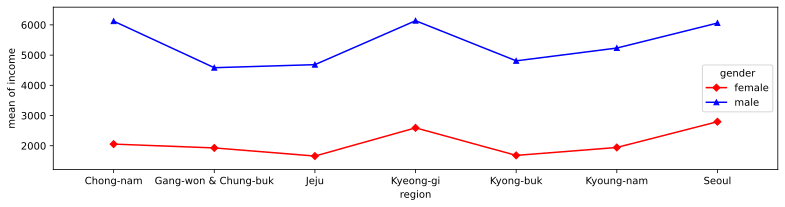

In [18]:
%matplotlib inline
import matplotlib.pyplot as plt
from statsmodels.graphics.factorplots import interaction_plot
fig, ax = plt.subplots(figsize=(13, 3))
fig = interaction_plot(x=df['region'],trace=df['gender'],response=df["income"],colors=["red", "blue"],markers=["D", "^"],ms=5,ax=ax)

Observamos que no existen diferencias muy significativas por regiones, pero si que Chong-nam, Kyeon-gi y Seoul son las regiones con mayor media de ingresos. 

**Ingresos por número de membros en la familia y sexo**

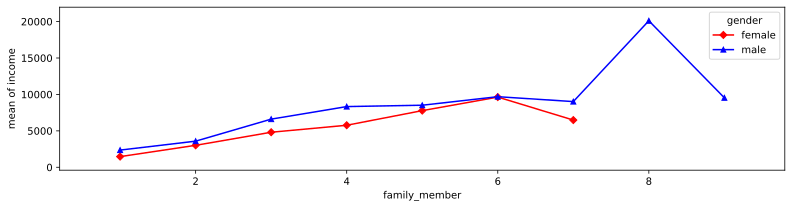

In [19]:
fig, ax = plt.subplots(figsize=(13, 3))
fig = interaction_plot(x=df.family_member,trace=df['gender'],response=df["income"],colors=["red", "blue"],markers=["D", "^"],ms=5,ax=ax,)

A medida que un ciudadano tiene más miembros de una familia, mayor tienden a ser la media de sus ingresos. Llama la atención que en esta dimensión la distribución para hombres y mujeres es muy similar.

**Ingresos por edad y sexo**

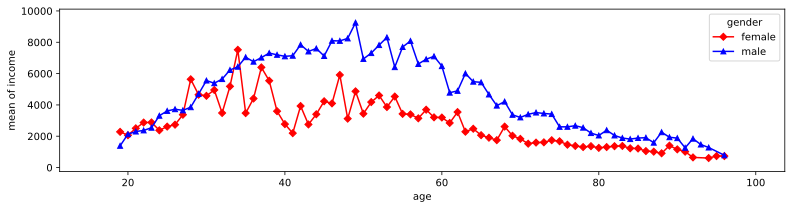

In [20]:
fig, ax = plt.subplots(figsize=(13, 3))
fig = interaction_plot(x=df.age,trace=df['gender'],response=df["income"],colors=["red", "blue"],markers=["D", "^"],ms=5,ax=ax,)

En el caso de la edad observamos como la población a partir de 20 años tiene unos ingresos crecientes hasta los 50 años. A partir de los 50 años empiezan a disminuir los ingresos. En el caso de los mujeres el comportamiento es mucho mas irregular; pero si que observamos un decrecimiento constante de los ingresos a partir de los 45 años.

**Ingresos por nivel educativo y sexo**

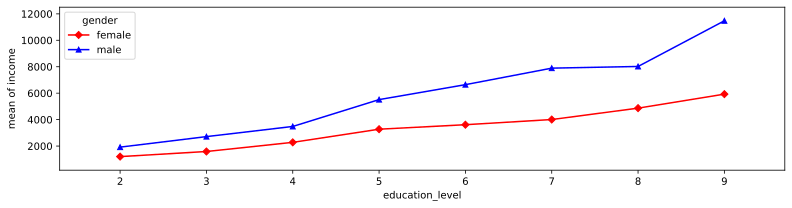

In [21]:
fig, ax = plt.subplots(figsize=(13, 3))
fig = interaction_plot(x=df.education_level,trace=df['gender'],response=df["income"],colors=["red", "blue"],markers=["D", "^"],ms=5,ax=ax,)

A medida que aumenta el nivel educativo aumenta la media de los ingresos de forma muy clara (tanto en hombres como en mujeres).

### 4.2 Comprobación de la normalidad y la homocedasticidad:

* Comprobaremos la normalidad sobre la distribución salarial logarítmica.
* Comprobaremos la homocedasticidad sobre la población de hombres y de mujeres.

#### 4.2.1. Normalidad de la distribución salarial en escala logarítmica:

Para comprobar la normalidad de una muestra podemos utilizar el test de Shapiro-Wilk. El problema es que el test de Shapiro-Wilk, no es un buen test para muestras grandes. Como alternativa tenemos el test D'Agostino's y Pearson's implementado en scipy.stats.normaltest.

También podemos utilizar el diagrama q-q.

In [22]:
from scipy import stats as st
from statsmodels.stats.diagnostic import lilliefors

In [23]:
# Obtnemos los datos en base logarítmica y los ordenamos:
log_income = df[df['log_income'] != 0]['log_income'].tolist()
li_s = sorted(log_income)

# Test D'agostino's:
statistic, pvalue = st.normaltest(li_s)
print(f"Estadístico observado: {statistic}, p-valor: {pvalue}")

Estadístico observado: 130.41931720381092, p-valor: 4.784153464922005e-29


In [24]:
# Con el test de lilliefors:
ksstat, pvalue = lilliefors(li_s, dist='norm', pvalmethod='table')
print(f"Estadístico observado: {statistic}, p-valor: {pvalue}")

Estadístico observado: 130.41931720381092, p-valor: 0.0009999999999998899


Según los datos anteriores deberíamos rechazar la hipótesis nula de que la variable $ log\_income \in N(0,1)$ dado que el $p-valor < \alpha$ siendo $\alpha = 0.05$.

* Veamos ahora el diagrama q-q:

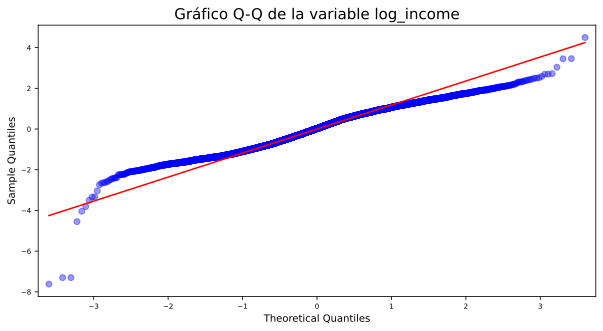

In [25]:
from statsmodels.graphics.gofplots import qqplot

fig, ax = plt.subplots(figsize=(10,5))


qqplot(
    pd.DataFrame({'log_income': li_s}),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = ax
)

ax.set_title('Gráfico Q-Q de la variable log_income', fontsize = 15)
ax.tick_params(labelsize = 7)




Podemos **descartar los outliers y comprobar de nuevo la normalidad**:

In [26]:
def RIC (data):
    return (np.percentile(data, 75) - np.percentile(data, 25))

RIC(df['log_income'])

1.4381584693717615

In [27]:
datos = li_s
outliers_max = np.median(datos) + 1.5*RIC(datos)
outliers_min = np.median(datos) - 1.5*RIC(datos)

print(f"los outliers son menores que {outliers_min} o mayores que {outliers_max}")

los outliers son menores que 5.84579096232709 o mayores que 10.160266370442375


In [28]:
li_s2 = df[(df['log_income'] < outliers_max) \
           & (df['log_income'] > outliers_min)]['log_income'].tolist()

px.histogram(x=li_s2,nbins=int(np.sqrt(len(df.log_income))),
             marginal="box",title='Histogram & Box-Plot: BMI',
             template='ggplot2').update_traces(dict(marker_line_width=1, marker_line_color="black", 
                                                    marker_color='darkcyan'))

In [29]:
li_s2 = sorted(li_s2)

# D'agostino's:
statistic, pvalue = st.normaltest(li_s2)
print(f"D'agostino's: Estadístico observado: {statistic}, p-valor: {pvalue}")

# Con el test de lilliefors:
ksstat, pvalue = lilliefors(li_s2, dist='norm', pvalmethod='table')
print(f"Lilliefors: Estdístico observado: {ksstat}, p-valor: {pvalue}")

D'agostino's: Estadístico observado: 1083.4746858076555, p-valor: 5.326737997054282e-236
Lilliefors: Estdístico observado: 0.05529324144174286, p-valor: 0.0009999999999998899


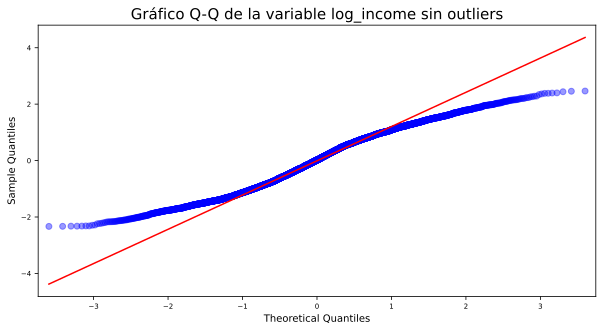

In [30]:
fig, ax = plt.subplots(figsize=(10,5))

qqplot(
    pd.DataFrame({'log_income sin outliers': li_s2}),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = ax
)

ax.set_title('Gráfico Q-Q de la variable log_income sin outliers', fontsize = 15)
ax.tick_params(labelsize = 7)

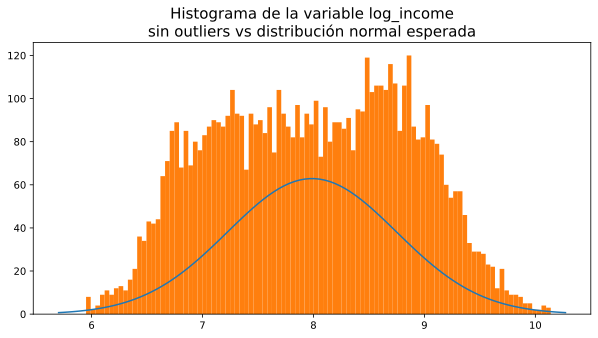

In [31]:
bins = 100
hist, bin_edges = np.histogram(li_s2, bins)

a = max(hist)
b = np.mean(li_s2)
c = np.std(li_s2)**2

x = np.linspace(b-3*c, b+3*c, bins)
y = st.norm.pdf(x, b, c)

fig, ax = plt.subplots(figsize = [10, 5])
_ = ax.plot(x, a*y)
_ = ax.hist(li_s2, bins = bins)

title = 'Histograma de la variable log_income\nsin outliers vs distribución normal esperada'
_ = ax.set_title(title, fontsize = 15)

Viendo los resultados, pese que a no distar demasiado de una distribución normal, **no podemos decir** que la distribución resultante de aplicar la transformación logarítmica a la variable income, **sea una distribución normal**.

* Por una parte, los estadísticos nos dan un $p-valor$ siempre menor que el valor de significancia $\alpha$, por lo que se rechaza la hipótesis nula que implica que la distribución de la población $\in N(0,1)$ por lo que se asume que no hay normalidad.

* Por otra parte el diagrama q-q tiene muchos valores fuera de la recta que indica normalidad. Con el patrón que tenemos, en otros casos quizás se podría asumir normalidad, dado que hay bastantes valores por encima de la línea que representa la normalidad. Sin embargo, tenemos un número de grados de libertad elevado, por lo que la muestra debería representar bien la población que se estudia. Es decir, la falta de correspondencia en la muestra respecto a una distribución normal es menos tolerable, ya que por la cantidad de medidas, si no tenemos los datos distribuídos normalmente, es que la población no lo estará.

* Por último, podemos ver como el histograma queda fuera de la campana de Gauss dibujada sobre el mismo. Obtenemos un histograma similar a una campana achatada por la media, con aparentemente dos leves "jorobas".

* Observando esto, sería interesante observar los histogramas según otros atributos del dataset, para ver si lo que tenemos en realidad son varias distribuciones normales superpuestas.

#### 4.2.2 Comprobación de la homocedasticidad entre las poblaciones de hombres y mujeres:

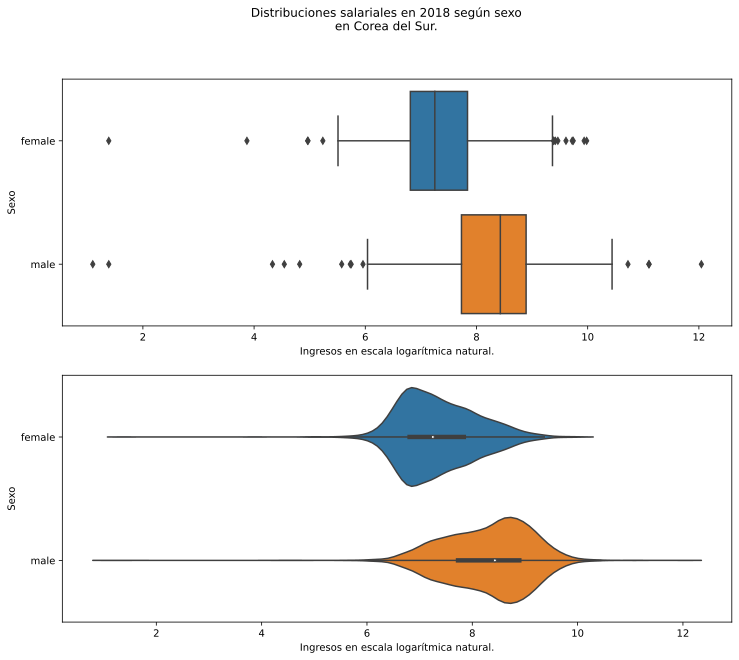

In [32]:
fig, ax = plt.subplots(ncols=1, nrows=2, figsize=(12,10), dpi = 140)

_ = sns.boxplot(data = df, x = 'log_income', y = 'gender', orient = 'h', ax = ax[0])

_ = sns.violinplot(data = df, x = 'log_income', y = 'gender', orient = 'h', ax = ax[1])

fig.suptitle('Distribuciones salariales en 2018 según sexo\nen Corea del Sur.')

_ = ax[0].set_xlabel('Ingresos en escala logarítmica natural.')
_ = ax[0].set_ylabel('Sexo')

_ = ax[1].set_xlabel('Ingresos en escala logarítmica natural.')
_ = ax[1].set_ylabel('Sexo')

A simple vista, según los gráficos anteriores, podemos ver que existe desigualdad salarial donde el sexo parece ser importante. Aunque esto lo trataremos en el siguiente apartado.

En este caso vamos a compromar la homocedasticidad entre las dos muestras: vamos a comprobar si las distribuciones tienen una varianza similar o no. Este test, nos servirá para elegir el estadístico a la hora de contrastar la media de las dos muestras más adelante.

Para comprobar la homocedasticidad podemos usar el [*test de Levene*](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.levene.html) también disponible en R. El test de Levene es menos sensible que otros test, como el F-test a la no normalidad de las muestras, así que de este modo no tenemos que comprobar la normalidad de la población de hombres y mujeres.

La **hipótesis nula** que comprobará el test de Levene es la de que las dos muestras tienen varianza similar por lo que si el *p-valor* obtenido es menor que el nivel de significancia $\alpha$ se rechazará la hipótesis nula.

In [33]:
salario_hombres = df[df['gender'] == 'male']['income']
salario_mujeres = df[df['gender'] == 'female']['income']

statistic, pvalue = st.levene(salario_hombres, salario_mujeres)

alpha = 0.05

if pvalue < alpha:
    print(f"El p-valor = {pvalue}, es menor que alfa, {alpha}\n\
    por lo que se rechaza la hipótesis nula y se considera\n\
    por tanto que las muestras tienen varianzas distintas.")
else:
     print(f"El p-valor = {pvalue}, es mayor que afa, {alpha}\
    por lo que se rechaza la hipótesis nula y se considera\n\
    por tanto que las muestras tienen varianzas iguales.")

El p-valor = 1.7858965392028168e-92, es menor que alfa, 0.05
    por lo que se rechaza la hipótesis nula y se considera
    por tanto que las muestras tienen varianzas distintas.


### 4.3 Aplicación de pruebas estadísticas para comparar los grupos de datos. 


#### 4.3.1 ¿Son los ingresos de los hombres iguales a los de las mujeres? Contraste de hipótesis bilateral sobre la media salarial de la población de hombres y la poblacion de mujeres:

El test en cuestión comprobará si el salario medio entre hombres y mujeres es diferente. Tenemos pues:

* Hipótesis nula: $H_o: \mu_{salario\_hombres}= \mu_{salario\_mujeres}$.
* Hipótesis alternativa: $H_1: \mu_{salario\_hombres}\neq \mu_{salario\_mujeres}$.


El test se trata de un contraste de hipótesis bilateral sobre la muestra de dos poblaciones y varianza desconocida diferente (según el resultado obtenido en el test de homocedasticidad del apartado anterior).

Para este tipo de test, disponemos del **estadístico t, que sigue una distribución t de Student.**

Este test está implementado en las funciones `ttest_ind_from_stats` y `ttest_ind` de la librería scipy.


Podemos utilizar este estadístico sabiendo que según el **teorema del límite central**, independientemente de que la población original siga una distribución normal o no, la distribución de las medias muestrales si lo hará.


In [34]:
m1 = np.mean(salario_hombres)
m2 = np.mean(salario_mujeres)

s1 = np.var(salario_hombres)
s2 = np.var(salario_mujeres)

n1 = len(salario_hombres)
n2 = len(salario_mujeres)


tobs , pvalue = st.ttest_ind_from_stats(mean1 = m1,
                        std1 = np.sqrt(s1),
                        nobs1 = n1,
                        mean2 = m2,
                        std2 = np.sqrt(s2),
                        nobs2 = n2,
                        equal_var = False)

print(f"Tobs: {tobs}, p-valor: {pvalue}")

Tobs: 38.31434993055128, p-valor: 2.181815868848783e-287


El **p-valor es** $0 < \alpha = 0.05$, por lo que se **rechaza la hipótesis nula** $H_0$ que implica igualdad salarial entre hombres y mujeres, y se acepta la hipótesis alternativa $H_1: \mu_{salario\_hombres}\neq \mu_{salario\_mujeres}$.

Podemos hacernos ahora la pregunta de cuanto más ganan los hombres de que las mujeres. ?

#### 4.3.2.a ¿Podemos decir entonces que los hombres de corea del sur ganan 3000 M₩ más que las mujeres?. Test de contraste unilateral por la derecha sobre la media de dos muestras:

* Hipótesis nula: $H_o: \mu_{salario\_hombres} - \mu_{salario\_mujeres} = \delta_{hm}$.
* Hipótesis alternativa: $H_1: \mu_{salario\_hombres} - \mu_{salario\_mujeres} > \delta_{hm}$.


Siendo $\delta_{hm} = 3000$.


El test que haremos ahora es un test sobre la diferencia de la media unilateral por la unilateral por la derecha.

El test es similar al realizado anteriormente.

In [35]:
m1 = np.mean(salario_hombres)
m2 = np.mean(salario_mujeres) + 3000

s1 = np.var(salario_hombres)
s2 = np.var(salario_mujeres)

n1 = len(salario_hombres)
n2 = len(salario_mujeres)


tobs , pvalue = st.ttest_ind_from_stats(mean1 = m1,
                        std1 = np.sqrt(s1),
                        nobs1 = n1,
                        mean2 = m2,
                        std2 = np.sqrt(s2),
                        nobs2 = n2,
                        equal_var = False,
                        alternative = 'greater')

print(f"Tobs: {tobs}, p-valor: {pvalue}")


Tobs: 3.969427570452338, p-valor: 3.644531412576039e-05


¿Y 2600 M₩ más?

* Hipótesis nula: $H_o: \mu_{salario\_hombres} - \mu_{salario\_mujeres} = \delta_{hm}$.
* Hipótesis alternativa: $H_1: \mu_{salario\_hombres} - \mu_{salario\_mujeres} > \delta_{hm}$.


Siendo $\delta_{hm} = 3400$.


In [36]:
m1 = np.mean(salario_hombres)
m2 = np.mean(salario_mujeres) + 3400

s1 = np.var(salario_hombres)
s2 = np.var(salario_mujeres)

n1 = len(salario_hombres)
n2 = len(salario_mujeres)


tobs , pvalue = st.ttest_ind_from_stats(mean1 = m1,
                        std1 = np.sqrt(s1),
                        nobs1 = n1,
                        mean2 = m2,
                        std2 = np.sqrt(s2),
                        nobs2 = n2,
                        equal_var = False,
                        alternative = 'greater')

print(f"Tobs: {tobs}, p-valor: {pvalue}")

Tobs: -0.6098954108941875, p-valor: 0.7290228536878411


Como en el último test, el p-valor es $> \alpha$ **se acepta la hipótesis nula**, que el salario medio de los hombres es cercano a 3400 M₩ por encima del salario medio de las mujeres.

Es decir, **los hombres ganan en torno a 3400 M₩ más que las mujeres.**

#### 4.3.3 Modelo de Regresion explicativo del los log ingresos con CatBoost Regressor

Crearemos un modelo predictor con CatBoost, un algoritmo de Gradient Boosting con árboles de decisión. Este algoritmo genera un modelo predictivo muy robusto en forma de un conjunto de muchos árboles de decisión "débiles". Para más información, ver:

https://catboost.ai/news/catboost-enables-fast-gradient-boosting-on-decision-trees-using-gpus

Este modelo es muy útil cuando se dispone de muchas variables categoricas ya que nos permite entrenarlo sin tener que codificar las variables categoricas. También nos permite obtener un modelo interpretable en relación al poder explicativo de sus atributos.

In [37]:
#Separamos los datos en una matriz de atributos y el target
X=df[['region','family_member','gender','education_level', 'religion','company_size','age','reason_none_worker']]
y=df.log_income

In [38]:
#Preparamos los adtos para procesar atributos discretos
categorical_features_indices = np.where(X.dtypes == 'object') [0]

In [39]:
#Creamos y entrenamos el modelo
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_pool = Pool(X_train, y_train,cat_features=categorical_features_indices)
validation_pool = Pool(X_val, y_val,cat_features=categorical_features_indices)

In [40]:
model = CatBoostRegressor(iterations=5000,  random_seed=42, early_stopping_rounds=50)

model.fit(train_pool, eval_set=validation_pool, verbose=100, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.024608
0:	learn: 0.8912782	test: 0.8786179	best: 0.8786179 (0)	total: 153ms	remaining: 12m 45s
100:	learn: 0.4913591	test: 0.4794659	best: 0.4794659 (100)	total: 2.19s	remaining: 1m 46s
200:	learn: 0.4711007	test: 0.4661414	best: 0.4661414 (200)	total: 4.21s	remaining: 1m 40s
300:	learn: 0.4642651	test: 0.4635676	best: 0.4635676 (300)	total: 6.16s	remaining: 1m 36s
400:	learn: 0.4589616	test: 0.4621923	best: 0.4621644 (397)	total: 8.19s	remaining: 1m 33s
500:	learn: 0.4545506	test: 0.4615260	best: 0.4615260 (500)	total: 10.2s	remaining: 1m 31s
600:	learn: 0.4499340	test: 0.4611496	best: 0.4610548 (564)	total: 12.3s	remaining: 1m 29s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.4610547646
bestIteration = 564

Shrink model to first 565 iterations.


Entrenamos el modelo con 5000 iteraciones validando los datos con el conjunto de validación. A partir de las propiedades del DataSet y nuestros predictores, el modelo establece una tasa de aprendizaje de 0,024628. 

Usando el conjunto de validación con el entrenamiento de los datos, el algoritmo selecciona el número de árboles que minimizan la función de coste.

En el log podemos ver cómo a medida que el modelo aprende con los datos, el error de aprendizaje y el error de validación disminuyen con cada iteración (generación de nuevos árboles). Después de 100 iteraciones, el modelo tiene progresivamente menos y menos errores en el conjunto de validación. El modelo comienza a sobreajustarse cuando aumenta el número de iteraciones, pero el número de errores de validación no disminuye o comienza a aumentar. 

Como hemos seleccionado early_stopping_rounds = 50, el modelo se detiene cuando pasan 50 iteraciones sin reducir los errores del conjunto de validación.

El modelo obtiene los errores más bajos con 564 árboles. A partir de aquí, el modelo comienza a sobreajustarse a los datos de entrenamiento. 

In [41]:
model.score(X_val, y_val)

0.7337330039613762

El coeficiente de determinación del modelo de regresión es 0.73, por lo que dispone de un poder exlicativo de los datos relativamente alto.

## 5.Representación de los resultados a partir de tablas y gráficas.

### 5.1 Test de normalidad sobre la variable "log_income".

Hemos comprobado la normalidad en la distribución de la muestra resultante de pasar a escala logarítmica natural la variable income, obteniendo los resultados en los que **se rechaza la hipótesis nula que implica la existencia de normalidad** en la muestra con los resultados:

* `Test D'agostino's: Estdístico observado: 130.41931720381092, p-valor: 4.7841e-29`
* `Test de Lilliefors: Estdístico observado: 130.41931720381092, p-valor: 0.0009`

El `diagrama qq` sin embargo muestra muchas muestras sobre la línea que indica normalidad, sin embargo, no es suficiente como para asegurar la normalidad en la muestra.

A continuación se han eliminado los *outliers* dado que podrían estar afectando al cálculo de los test y podría ser interesante descartarlos para obtener una muestra distribuída normalmente, pero nuevamente, hemos obtenido **resultados similares**.

Es posible que dividiendo la muestra en muestras más pequeñas según otras características como sexo, estudios o tipo de ocupación obtengamos muestras que si siguen una distribución normal. Otra opción sería la de probar la transformación de la variable con alguna otra función matemática.

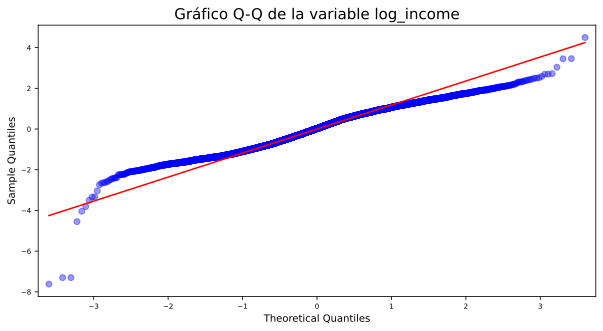

In [42]:
from statsmodels.graphics.gofplots import qqplot

fig, ax = plt.subplots(figsize=(10,5))


qqplot(
    pd.DataFrame({'log_income': li_s}),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = ax
)

ax.set_title('Gráfico Q-Q de la variable log_income', fontsize = 15)
ax.tick_params(labelsize = 7)

### 5.2 Test de homocedasticidad y contrastes de hipótesis sobre la variable género:

Como hemos comentado la diferencia salarial según el sexo en Corea del Sur es bastante grande. Para el año 2018 determinamos que los hombres ganan aproximadamente 3400M₩ más que las mujeres, según los contrastes de hipótesis que hemos realizado:

* $H_1: \mu_{salario\_hombres}\neq \mu_{salario\_mujeres}$:
    * Tobs: 38.314, p-valor: 2.181e-287. Se rechaza $H_0$ y se acepta $H_1$.
* Hipótesis alternativa: $H_1: \mu_{salario\_hombres} - \mu_{salario\_mujeres} > 3000$.
    * Tobs: 3.969, p-valor: 3.644e-05. Se rechaza $H_0$ y se acepta $H_1$.
* Hipótesis alternativa: $H_1: \mu_{salario\_hombres} - \mu_{salario\_mujeres} > 3400$.
    * Tobs: -0.609, p-valor: 0.729. Se acepta $H_0$.
    
Para todos los tests anteriores se ha usado el estadístico t, que sigue una distribución normalizada de t-student. 

Previamente se ha realizado el **test de homocedasticidad**, necesario para elegir el tipo de estadístico, y que indica que que las varianzas de las dos poblaciones no son iguales. Para ello se ha utilizado el test de Levene:

* Test de Levene: El p-valor = 1.7858e-92:
    * Se rechaza $H_0$ y por lo tanto la igualdad de varianza en las poblaciones.


Esto se puede ver en el siguiente histograma:

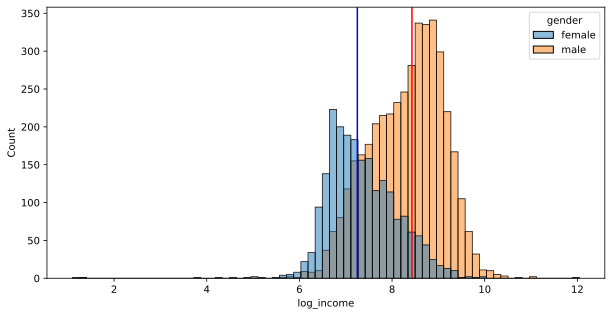

In [43]:
fig, ax = plt.subplots(figsize = [10,5])

_ = sns.histplot(df, x='log_income', hue = 'gender', ax = ax)

femedian = np.median(df[df['gender']=='female']['log_income'])
mamedian = np.median(df[df['gender']=='male']['log_income'])

_ = ax.axvline(x = femedian, color = 'b')
_ = ax.axvline(x = mamedian, color = 'r')

Y también **lo hemos podido ver en los diagramas de caja y los diagramas de violín** mostrados durante la resolución del ejercicio:

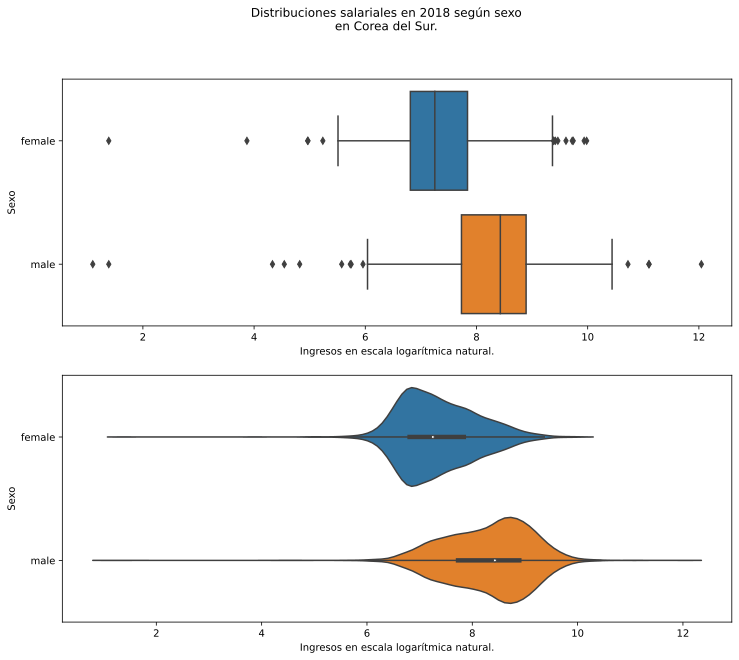

In [44]:
fig, ax = plt.subplots(ncols=1, nrows=2, figsize=(12, 10), dpi = 140)

_ = sns.boxplot(data = df, x = 'log_income', y = 'gender', orient = 'h', ax = ax[0])
_ = sns.violinplot(data = df, x = 'log_income', y = 'gender', orient = 'h', ax = ax[1])


fig.suptitle('Distribuciones salariales en 2018 según sexo\nen Corea del Sur.')

_ = ax[0].set_xlabel('Ingresos en escala logarítmica natural.')
_ = ax[0].set_ylabel('Sexo')

_ = ax[1].set_xlabel('Ingresos en escala logarítmica natural.')
_ = ax[1].set_ylabel('Sexo')

Como decíamos y como se muestra en los gráficos anteriores la media de ingresos de los hombres es significativamente mayor a la de las mujeres, pero además, en la población femenina, la mayoría de sus miembros se agrupan en las rentas con menores ingresos, ocurriendo lo contrario entre los hombres.


Esto es un **indicio de una gran brecha salarial** relacionada con el sexo, sin embargo, debe ser tratada como tal, como un indicio, y empezar a indagar para poder descubrir las verdaderas causas que provocan este efecto. Para ello necesitaríamos un conocimiento *a priori* que requeriría de profundizar más en la ideología (en sentido amplio: religión, costumbres, tradiciones, historia...) y base (economía, sistema político) de Corea del Sur lo que escapa a esta práctica. No obstante, también nos podemos apoyar en los propios datos para complementar el análisis:

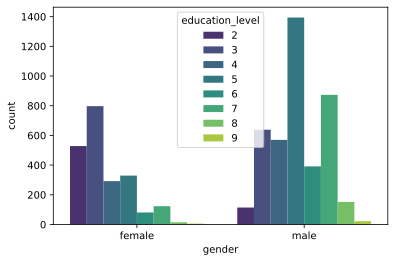

In [45]:
fig = plt.figure()


_ = sns.countplot(hue='education_level',
                  x='gender',
                  data = df,
                  palette='viridis')


Por ejemplo, si observamos la cantidad de muestras que tenemos para cada sexo según el nivel de estudios se puede observar que, en el caso de los hombres, hay una mayor proporción para los niveles 5 (Estudios superiores) y 7(Grado universitario) que en el caso de las mujeres. Es decir, a priori los hombres suelen cursar estudios superiores mientras que las mujeres no, y esto puede verse reflejado en los ingresos al ocupar los primeros puestos más cualificados.

<AxesSubplot:xlabel='education_level', ylabel='income'>

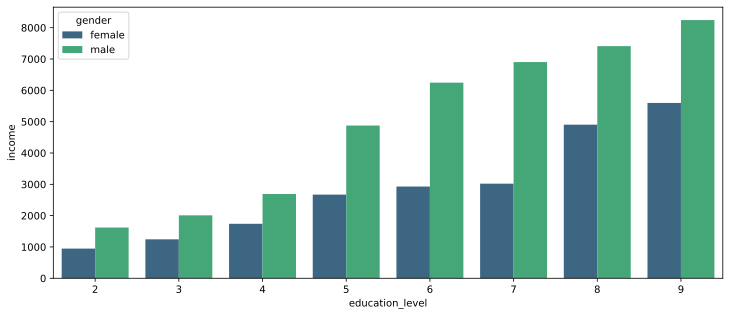

In [46]:
da=df[['gender', 'education_level', 'income']].groupby(['gender', 'education_level']).median().reset_index()
plt.figure(figsize=(12,5))
sns.barplot(data=da, y = 'income', x='education_level', hue='gender', palette = "viridis")

Sin embargo, el nivel de estudios no sería determinante, dado que para el mismo nivel de estudios nuestros, datos vuelven a indicar desigualdad salarial, especialmente para los estudios superiores (5, 6, 7).

Pese a esto, hay que tener en cuenta que en las democracias liberales desarrolladas actuales, se suelen premiar aquellos trabajos relacionados técnicos, por lo que, para tener un análisis con más precisión, sería bueno conocer que tipo de estudios cursan hombres y mujeres. En nuestro caso no disponemos de estos datos.

Para acercarnos más a esto podemos observar el tipo de ocupación:

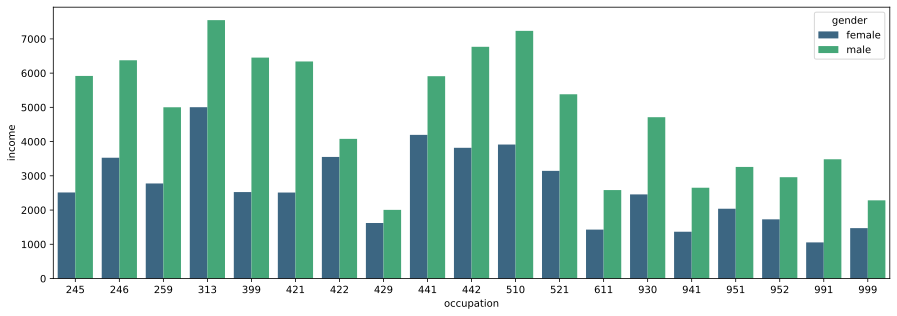

In [47]:
# Calculamos las muestras que hay para cada tipo de trabajo y sexo:
da = df[['gender','occupation', 'income']].groupby(['gender','occupation']).count().reset_index()
da.columns = da.columns.tolist()[:-1] + ['ocurrencias']

# Obtenemos una lista de las ocupaciones donde hay más mujeres: 
occu_list = da[da['gender']=='female'].sort_values(by='ocurrencias').iloc[-20:-1]['occupation'].tolist()

# Seleccionamos aquellos trabajos de la lista generada anteriormente:
da = df[df['occupation'].isin(occu_list)][['gender', 'occupation', 'income']]

# Agrupamos por sexo y tipo de ocupación y obtenemos la media de esos grupos:
da = da.groupby(['gender', 'occupation']).median().reset_index()

# Generamos el gráfico:
plt.figure(figsize = (15,5))
_ = sns.barplot(data = da, x='occupation', y='income', hue='gender', palette='viridis')

Tras este análisis complementario, podemos concluir que, si bien la desigualdad salarial no es igual para todos los tipos de ocupaciones, según nuestros datos, existe una brecha de género salarial significativa e independiente del puesto y estudios, que en principio apuntaría tanto a una **discriminación directa a la hora de establecer sus salarios** como a la *ideología*(nuevamente en sentido amplio) o indiosincrasia que haría que las mujeres **no cursasen estudios superiores** para poder acceder a mejores salarios.

Como se ha comentado antes, para poder confirmar el conocimiento derivado de este conjunto de datos, sería necesario comprender mejor el país y así concretizar las verdaderas causas.

###  5.3 Interpretabilidad modelo de regresión CatBoost

Podemos computar la **importancia de cada atributo** para configurar el modelo. La "importancia" mide cuánto cambia la predicción del modelo en promedio si cambiamos el valor del atributo. Cuanto mayor sea el valor de importancia, mayor será el cambio en el valor de predicción en promedio, si se cambia este predictor. Los valores están normalizados en modo que la suma de las importancias de todos los atributos es igual a 100.

In [48]:
ax=model.get_feature_importance(type='PredictionValuesChange',prettified=True)

fig = px.bar(ax, x='Feature Id',y=['Importances'],
              title="Cat Boost predictors importance - Prediction value change",
              color_discrete_sequence=px.colors.qualitative.Prism).update_layout( 
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)')

fig.show()



Observamos que la variable más importante del modelo es family member con mucha diferencia. Luego tenemos a la edad, company size y education_level.

Observamos que modificando el valor de family_member, las predicciones del modelo varían un 39.13%. 

Otro enfoque para interpretar el comportamiento del modelo es el análisis de los valores de shapley.

Las **explicaciones de Shapley (SHAP)** son un enfoque de teoría de juegos para explicar el resultado de cualquier modelo de aprendizaje automático. Tree SHAP nos permite dar una explicación del comportamiento del modelo, en particular de cómo cada atributo impacta las predicciones del modelo. Cada resultado / predicción se considera una suma de la contribución de cada atributo individual.

Esta figura nos brinda una gran cantidad de información sobre la estructura del modelo. En la figura podemos encontrar:

- Atributo más importante del modelo en el eje y en orden descendente (en la parte superior, el más importante).
- El valor SHAP de las observaciones en el eje x y muestra si el efecto de ese valor provocó una predicción mayor o menor.
- El valor de cada atributo con colores. Un valor alto está representado por rojo, mientras que un valor bajo está representado por azul.
- Cada punto representa el resultado de una predicción.

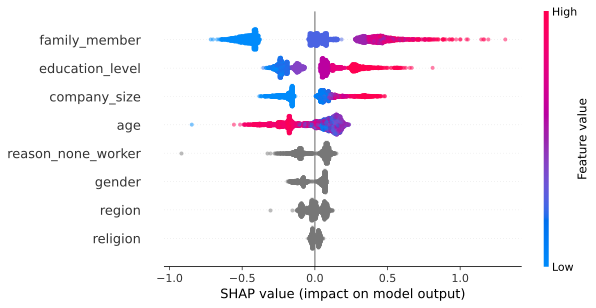

In [49]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train,alpha=0.5)

Como hemos visto el número de miembros de la familia es la variable más importante para determinar los ingresos, seguido del nivel educativo y tamaño de la empresa

Observamos cómo hay muchas observaciones con valores altos de miembros de familia (color rojo) tienen un impacto positivo en la predicción de los ingresos, y viceversa, valores bajos (color azul) tienen un impacto negativo en la predicción de los ingresos.

## 6. A partir de los resultados obtenidos, ¿cuáles son las conclusiones? 

En este ejercicio se han computado diferentes **técnicas de estadística descriptiva y de inferencia estadística** para examinar la distribución de los ingresos de la población de Corea del Sur desde distintos puntos de vista. (muestra año 2018) 

En el **preprocesado** de datos se han codificado los datos correctamente, se ha creado la variable edad y se han transformado los ingresos con un logarítmo natural para disponer de una variable más adecuada para la inferencia estadística.

En el **apartado 4** de selección de los grupos a analizar se ha examinado visualmente la exitencia de diferencias muy notorias de los ingresos entre los sexos. Se han examinado los efectos de los campos de las distintas categorias (miembros familia, edad, área geografica, estudios....). 

Para indagar empíricamente sobre estas diferencias, se han realizado varias pruebas estadísticas y construido un modelo de regresión con el algoritmo Catboost. 

Se ha comprobado como **los ingresos logarítmicos** (aún descartando los principales outliers de la distribución) si bien se acercan a una distribución normal, **no consiguen pasar los principales tests de normalidad**. También se ha revisado que las **varianzas entre las poblaciones de hombres y mujeres son distintas** con un nivel de significancia del 0.05.

Se ha examinado con un **test bilateral si los ingresos de hombres y las mujeres eran iguales y se ha concluido que no**. Con otro test se ha evidencia estadísticamente que el salario medio de los hombres es cercano a 3400 M₩ por encima del salario medio de las mujeres, lo que indica una gran brecha salaria relacionada con el género. Esto puede ser debido a diversas causas, como por ejemplo que los hombres de media tienen más proporción de estudios superiores,... 

Para cada uno de los tests, se han detallado los resultados con figuras y explicaciones pertinentes.

El **modelo de regresión con árboles de decisión Catboost Regressor** nos ha permitido construir un modelo de regresión con un R2 de 0.73. El objetivo de este modelo es indagar sobre poder explicativo que tienen las diferentes variables sobre los ingresos logarítmicos. Para esto se ha analizado la importancia de las variables y se ha concluido que el número de miembros de la familia de cada persona es la variable más influyente en determinar los ingresos de los ciudadanos de Corea del Sur, seguida a mucha distancia de la edad.

Con el **análisis Shap** hemos obtenido una conclusión similar con el número de miembros de la familia, pero dando mayor importancia al nivel educativo que la edad. 

## Contribuciones:

| Contribuciones          | Integrante 1           | Integrante 2           |
|-------------------------|------------------------|------------------------|
| Investigación previa    | Xavier Martínez Bartra | Martín Martínez Baltar |
| Redacción de respuestas | Xavier Martínez Bartra | Martín Martínez Baltar |
| Desarrollo de código    | Xavier Martínez Bartra | Martín Martínez Baltar |

## Fuentes:

* [Análisis de normalidad con python - cienciadedatos.net](https://www.cienciadedatos.net/documentos/pystats06-analisis-normalidad-python.html)
* [Análisis de homocedasticidad y heterocedasticidad con python - cienciadedatos.net](https://www.cienciadedatos.net/documentos/pystats07-test-homocedasticidad-heterocedasticidad-python.html)
* Contrastes de hipótesis - Ester Bernadó Mansilla (Estadística Avanzada) - UOC.
* [catboost.ai](https://catboost.ai/news/catboost-enables-fast-gradient-boosting-on-decision-trees-using-gpus)
* [SciPy](https://scipy.org/)
* [Matplotlib](https://matplotlib.org/)
* [seaborn: statistical data visualization](https://seaborn.pydata.org/)
* [stackoverflow](https://stackoverflow.com/)